# 9. Image Matching

---
Curso - **Visión computacional para imágenes y video**

Grupo 10

Equipo 58:

Carlos Alberto Ochoa Gonzáles - A01746583

Carlos Daniel Morales Torres - A0179068

Iván Nava Cardeño - A01361985

Natalia Nevarez Tinoco - A01566204

---

## Table of Contents
1. [Libraries](#libraries)
1. [ORB Matching](#orb)
1. [SIFT Matching](#sift)
1. [Challenge](#challenge)
1. [Discussion and Results](#dandr)

**Instrucciones**

No hacer modificación al código, la idea es probar que tan buenos son los diferentes descriptores para hacer matching de las imagenes. Se sugiera usar las imágenes con variaciones de iluminación y orientación y ver que tan bien se hace el matching con Harris por si mismo, o con otros descriptores como SIFT u ORB. Discutir hallazgos.

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import glob
import os
import pandas as pd

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# ORB (Oriented FAST and Rotated BRIEF) <a class="anchor" id="orb" ></a>

- Developed at OpenCV labs by Ethan Rublee, Vincent Rabaud, Kurt Konolige, and Gary R. Bradski in 2011
- Efficient and viable alternative to SIFT and SURF (patented algorithms)
- ORB is free to use
- Feature detection
- ORB builds on FAST keypoint detector + BRIEF descriptor

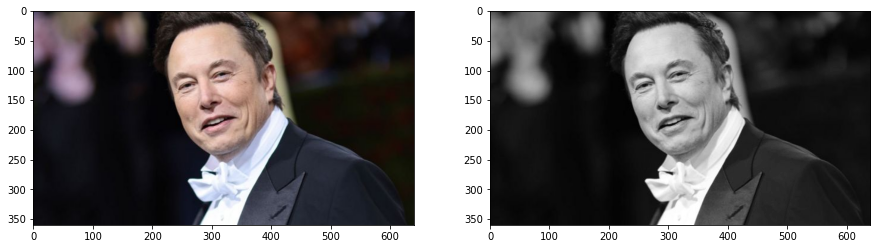

In [ ]:
#reading image
img = cv2.imread('data/elon_1.jpg')
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

### Create test image by adding Scale Invariance and Rotational Invariance

In [ ]:
test_image = cv2.pyrDown(img_color)
test_image = cv2.pyrDown(test_image)
num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

### Display traning image and testing image

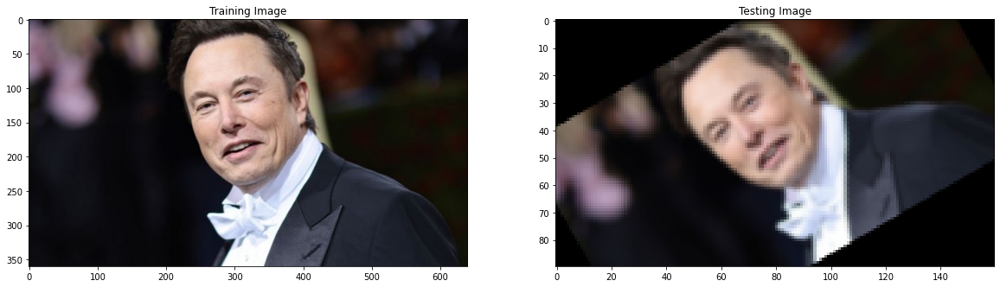

In [ ]:
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Training Image")
plots[0].imshow(img_color)

plots[1].set_title("Testing Image")
plots[1].imshow(test_image)

### ORB

In [ ]:
orb = cv2.ORB_create()

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  42


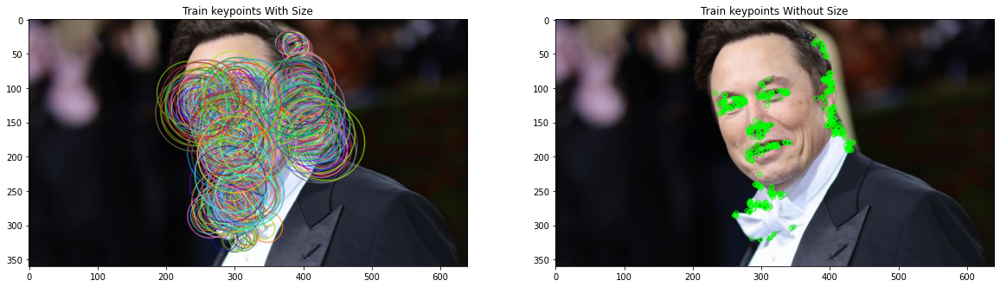

In [ ]:
train_keypoints, train_descriptor = orb.detectAndCompute(img_color, None)
test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(img_color)
keypoints_with_size = np.copy(img_color)

cv2.drawKeypoints(img_color, train_keypoints, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(img_color, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))

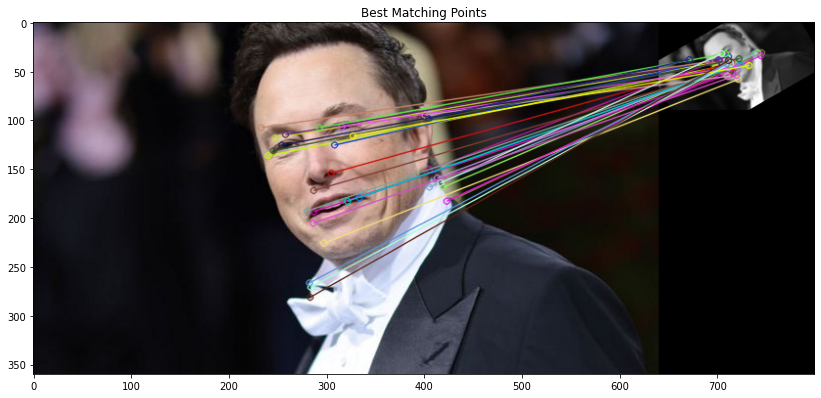


Number of Matching Keypoints Between The Training and Query Images:  30


In [ ]:

# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(img_color, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

## SIFT Matching (Scale Invariant Feature Transform) <a class="anchor" id="sift" ></a>

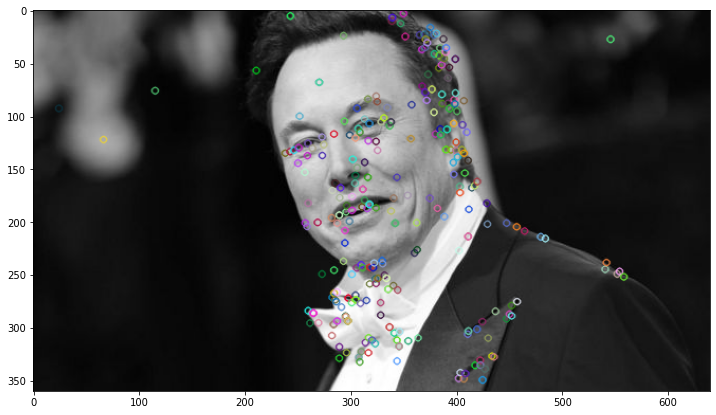

In [ ]:
img1 = cv2.imread('data/elon_1.jpg')
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

#keypoints
sift = cv2.SIFT_create()
keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)

img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1)
plt.imshow(img_1)

### Matching different images

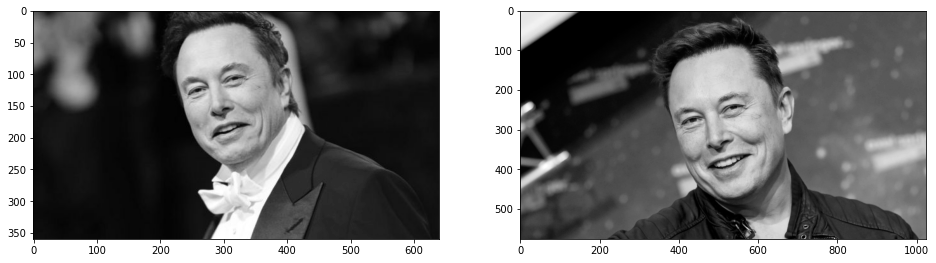

In [ ]:
# read images
img1 = cv2.imread('data/elon_1.jpg')
img2 = cv2.imread('data/elon_2.png')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

figure, ax = plt.subplots(1, 2, figsize=(16, 8))

ax[0].imshow(img1, cmap='gray')
ax[1].imshow(img2, cmap='gray')

### Extracting Keypoints with SIFT

In [ ]:
#sift
sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

len(keypoints_1), len(keypoints_2)

(291, 734)

### Feature Matching

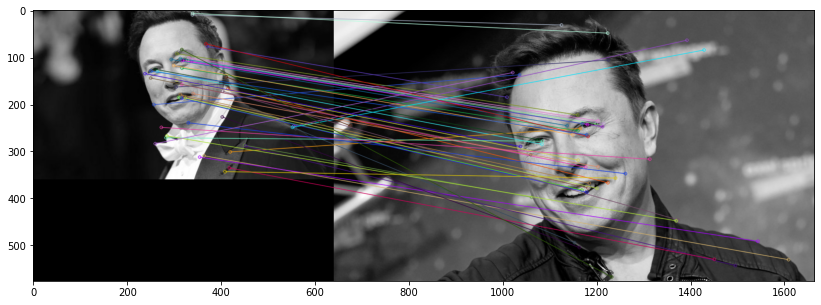

(<matplotlib.image.AxesImage at 0x164cc8821f0>, None)

In [ ]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
plt.imshow(img3),plt.show()

# Challenge

In [20]:
image_files = sorted(glob.glob("/content/drive/MyDrive/Colab Notebooks/MNA/Computer Vision/Semana7/images/*.jpg"))
print("Images found:", image_files)

imgs_rgb = {}
imgs_gray = {}

for f in image_files:
    img_bgr = cv2.imread(f)
    if img_bgr is None:
        print("WARNING: couldn't read", f)
        continue
    scale_percent = 40  # reduce to 40% of original size
    width = int(img_bgr.shape[1] * scale_percent / 100)
    height = int(img_bgr.shape[0] * scale_percent / 100)
    img_bgr = cv2.resize(img_bgr, (width, height))  # resize to speed up processing
    # Convert BGR to RGB
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    # Convert to grayscale float32
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    imgs_rgb[os.path.basename(f)] = img_rgb
    imgs_gray[os.path.basename(f)] = gray

Images found: ['/content/drive/MyDrive/Colab Notebooks/MNA/Computer Vision/Semana7/images/daylight_0deg.jpg', '/content/drive/MyDrive/Colab Notebooks/MNA/Computer Vision/Semana7/images/daylight_15deg.jpg', '/content/drive/MyDrive/Colab Notebooks/MNA/Computer Vision/Semana7/images/daylight_45deg.jpg', '/content/drive/MyDrive/Colab Notebooks/MNA/Computer Vision/Semana7/images/daylight_90rot.jpg', '/content/drive/MyDrive/Colab Notebooks/MNA/Computer Vision/Semana7/images/daylight_top.jpg', '/content/drive/MyDrive/Colab Notebooks/MNA/Computer Vision/Semana7/images/dimlight_0deg.jpg', '/content/drive/MyDrive/Colab Notebooks/MNA/Computer Vision/Semana7/images/dimlight_45deg.jpg', '/content/drive/MyDrive/Colab Notebooks/MNA/Computer Vision/Semana7/images/dimlight_90rot.jpg', '/content/drive/MyDrive/Colab Notebooks/MNA/Computer Vision/Semana7/images/flash_0deg.jpg', '/content/drive/MyDrive/Colab Notebooks/MNA/Computer Vision/Semana7/images/flash_45deg.jpg', '/content/drive/MyDrive/Colab Notebo

In [21]:
# Define baseline
base_name = "daylight_0deg.jpg"

if base_name not in imgs_gray:
    raise ValueError(f"{base_name} not found in images. Check the name.")

base_img_gray = imgs_gray[base_name]
base_img_rgb  = imgs_rgb[base_name]

In [22]:
# Create feature detectors/descriptors
# SIFT
sift = cv2.SIFT_create()

# ORB
orb = cv2.ORB_create(
    nfeatures=1000,
    scaleFactor=1.2,
    nlevels=8,
    edgeThreshold=31,
    firstLevel=0,
    WTA_K=2,
    scoreType=cv2.ORB_HARRIS_SCORE,
    patchSize=31,
    fastThreshold=20
)

# SURF (may or may not be available)
try:
   surf = cv2.xfeatures2d.SURF_create(hessianThreshold=400)
except:
   surf = None
   print("SURF not available in this OpenCV build.")

SURF not available in this OpenCV build.


In [23]:
def detect_and_describe(detector_name, img_gray):
    """
    detector_name: 'sift', 'orb', or 'surf'
    returns: keypoints, descriptors
    """
    if detector_name == 'sift':
        kps, desc = sift.detectAndCompute(img_gray, None)
    elif detector_name == 'orb':
        kps, desc = orb.detectAndCompute(img_gray, None)
    elif detector_name == 'surf':
        # assumes surf exists
        kps, desc = surf.detectAndCompute(img_gray, None)
    else:
        raise ValueError("Unknown detector")
    return kps, desc

def match_features(detector_name, descA, descB, ratio=0.75):
    """
    Runs KNN match and Lowe's ratio test.
    Returns list of good matches.
    """
    if detector_name in ['sift', 'surf']:
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    elif detector_name == 'orb':
        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
    else:
        raise ValueError("Unknown detector")

    raw_matches = bf.knnMatch(descA, descB, k=2)
    good = []
    for m,n in raw_matches:
        if m.distance < ratio * n.distance:
            good.append(m)
    return good

def draw_matches(imgA_rgb, kpsA, imgB_rgb, kpsB, good_matches, max_draw=40):
    """
    Returns a matplotlib-ready RGB image showing matches.
    """
    match_img = cv2.drawMatches(
        cv2.cvtColor(imgA_rgb, cv2.COLOR_RGB2BGR),
        kpsA,
        cv2.cvtColor(imgB_rgb, cv2.COLOR_RGB2BGR),
        kpsB,
        good_matches[:max_draw],
        None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )
    # drawMatches returns BGR, convert back to RGB for plt
    match_img = cv2.cvtColor(match_img, cv2.COLOR_BGR2RGB)
    return match_img


Comparing BASE daylight_0deg.jpg  -->  daylight_15deg.jpg
[SIFT] base_kps=23273, tgt_kps=12426, good_matches=4988


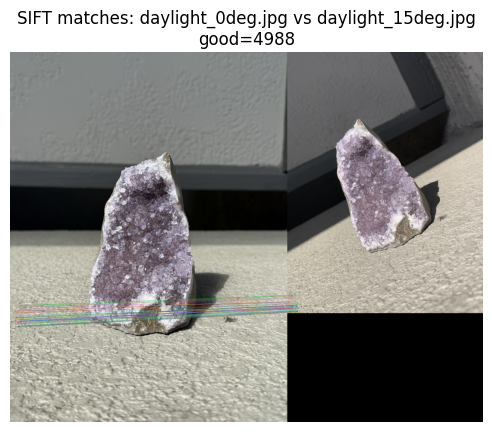

[ORB] base_kps=1000, tgt_kps=1000, good_matches=267


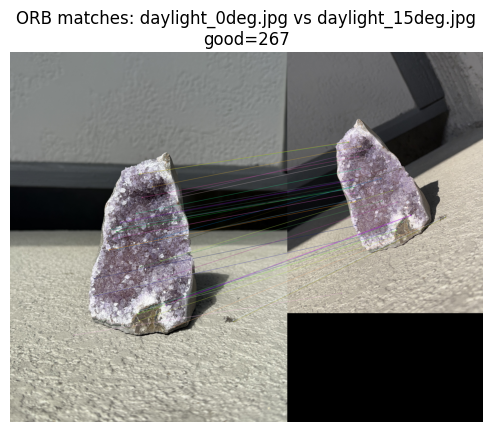

Comparing BASE daylight_0deg.jpg  -->  daylight_45deg.jpg
[SIFT] base_kps=23273, tgt_kps=21473, good_matches=5472


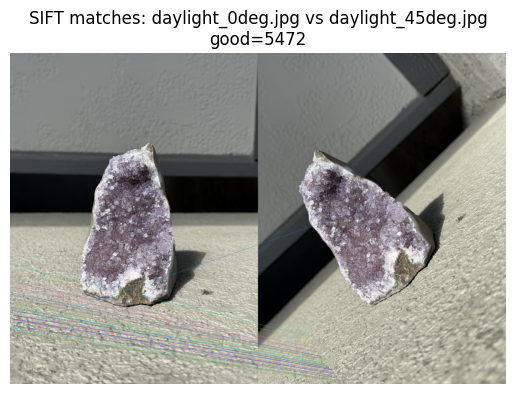

[ORB] base_kps=1000, tgt_kps=1000, good_matches=260


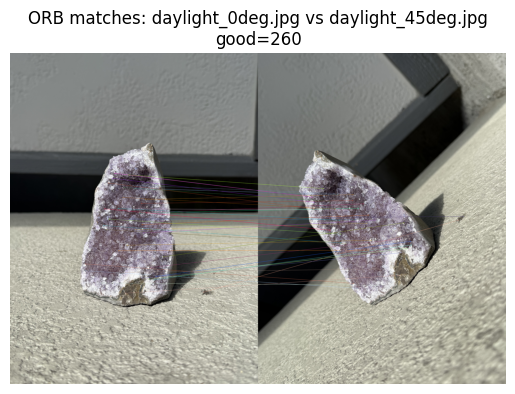

Comparing BASE daylight_0deg.jpg  -->  daylight_90rot.jpg
[SIFT] base_kps=23273, tgt_kps=21721, good_matches=3848


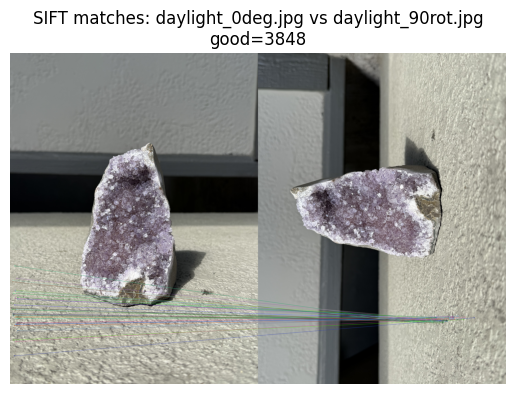

[ORB] base_kps=1000, tgt_kps=1000, good_matches=270


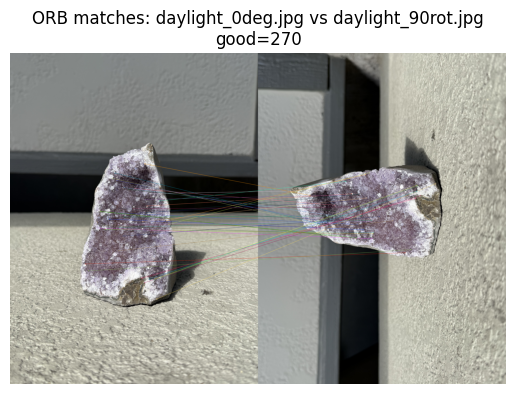

Comparing BASE daylight_0deg.jpg  -->  daylight_top.jpg
[SIFT] base_kps=23273, tgt_kps=21986, good_matches=23


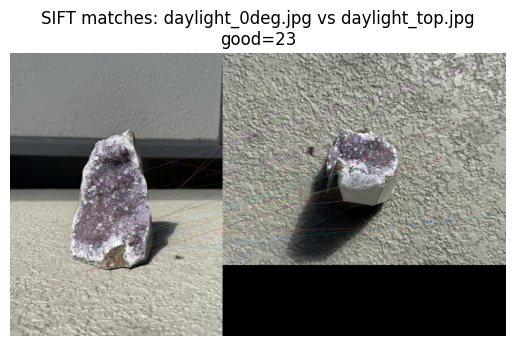

[ORB] base_kps=1000, tgt_kps=1000, good_matches=5


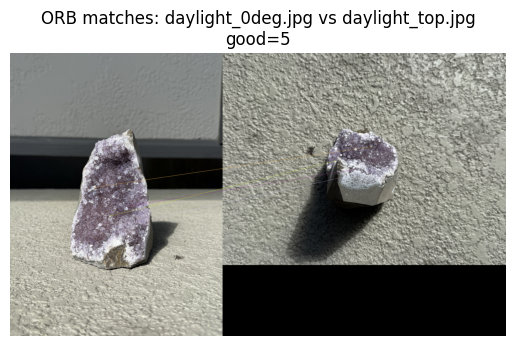

Comparing BASE daylight_0deg.jpg  -->  dimlight_0deg.jpg
[SIFT] base_kps=23273, tgt_kps=23184, good_matches=221


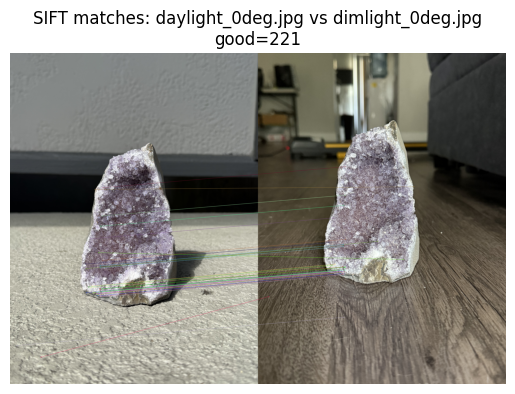

[ORB] base_kps=1000, tgt_kps=1000, good_matches=21


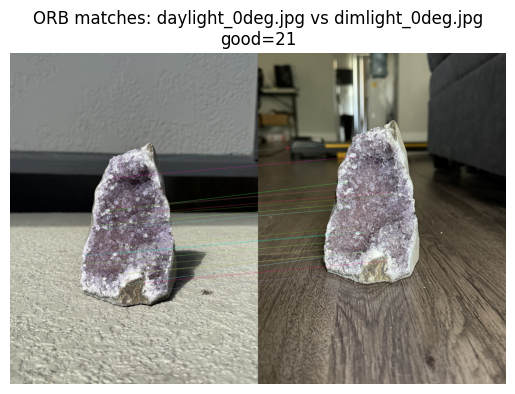

Comparing BASE daylight_0deg.jpg  -->  dimlight_45deg.jpg
[SIFT] base_kps=23273, tgt_kps=17567, good_matches=165


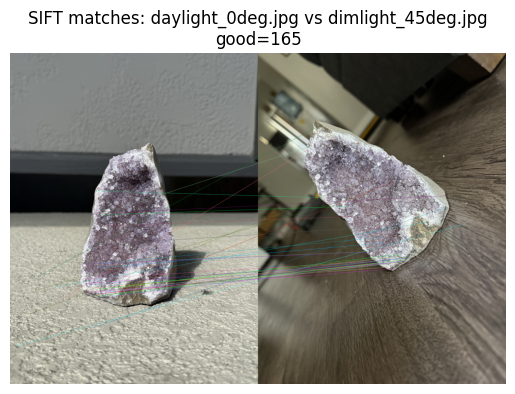

[ORB] base_kps=1000, tgt_kps=1000, good_matches=12


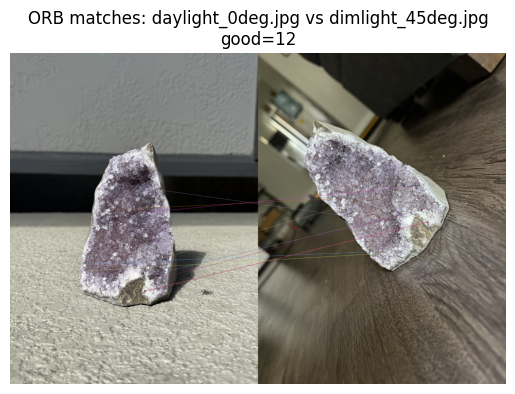

Comparing BASE daylight_0deg.jpg  -->  dimlight_90rot.jpg
[SIFT] base_kps=23273, tgt_kps=20790, good_matches=164


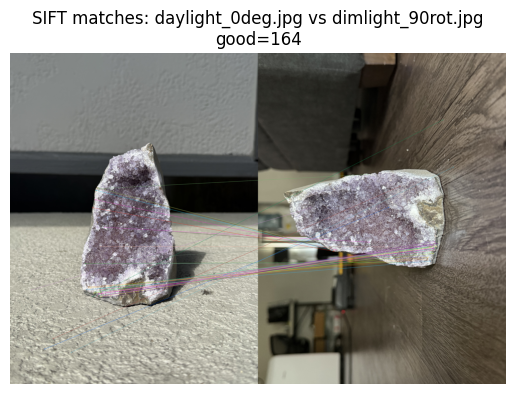

[ORB] base_kps=1000, tgt_kps=1000, good_matches=23


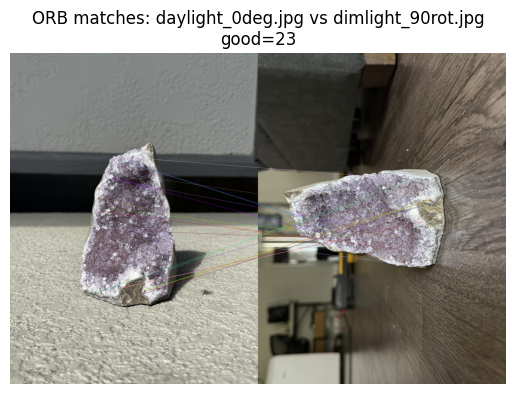

Comparing BASE daylight_0deg.jpg  -->  flash_0deg.jpg
[SIFT] base_kps=23273, tgt_kps=11743, good_matches=174


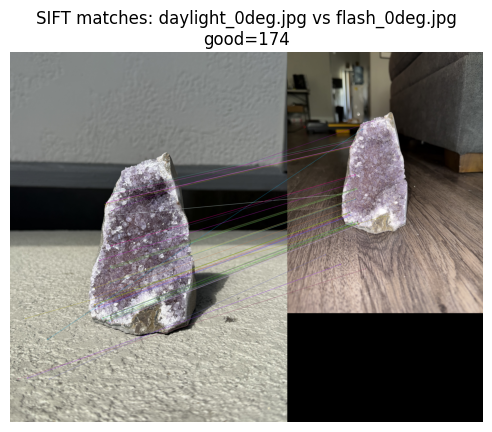

[ORB] base_kps=1000, tgt_kps=1000, good_matches=29


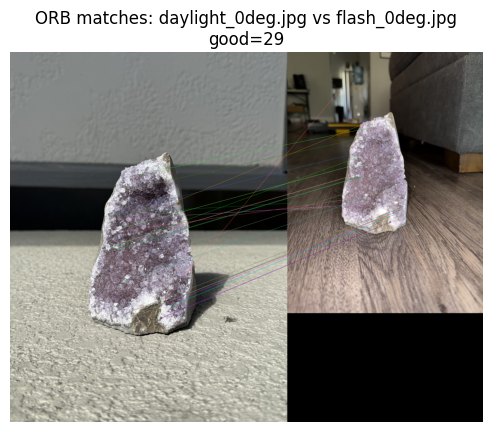

Comparing BASE daylight_0deg.jpg  -->  flash_45deg.jpg
[SIFT] base_kps=23273, tgt_kps=943, good_matches=66


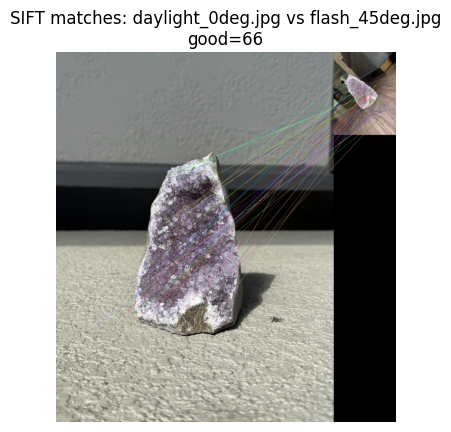

[ORB] base_kps=1000, tgt_kps=990, good_matches=2


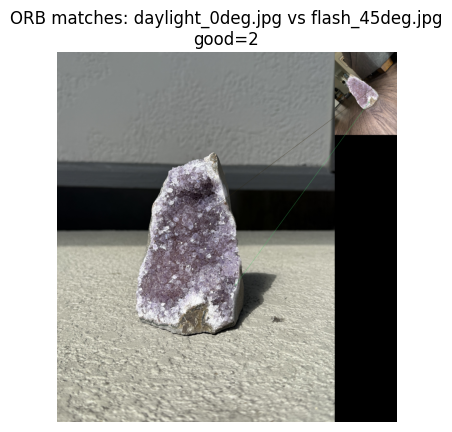

Comparing BASE daylight_0deg.jpg  -->  sidelamp_0deg.jpg
[SIFT] base_kps=23273, tgt_kps=22789, good_matches=56


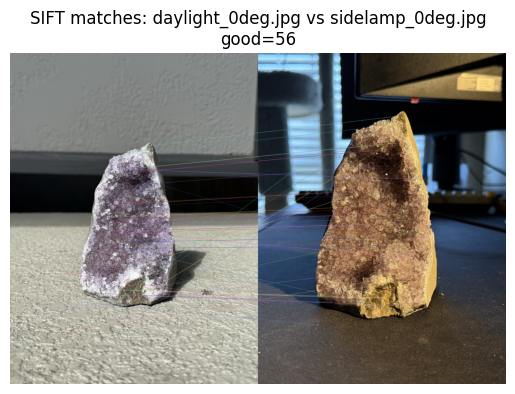

[ORB] base_kps=1000, tgt_kps=1000, good_matches=8


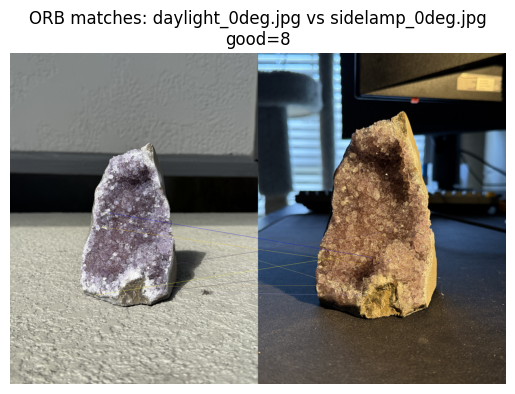

Comparing BASE daylight_0deg.jpg  -->  sidelamp_15deg.jpg
[SIFT] base_kps=23273, tgt_kps=24796, good_matches=64


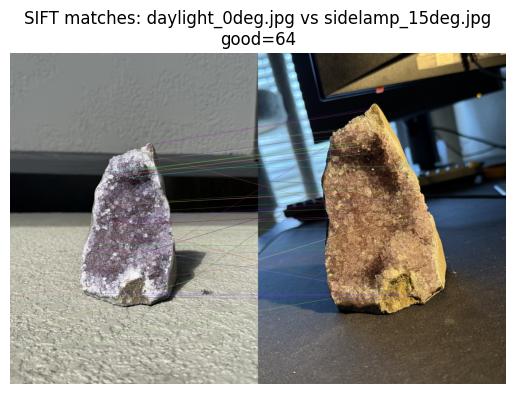

[ORB] base_kps=1000, tgt_kps=1000, good_matches=7


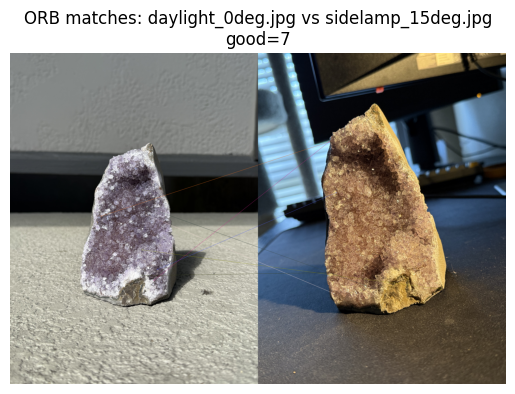

Comparing BASE daylight_0deg.jpg  -->  sidelamp_45deg.jpg
[SIFT] base_kps=23273, tgt_kps=24499, good_matches=68


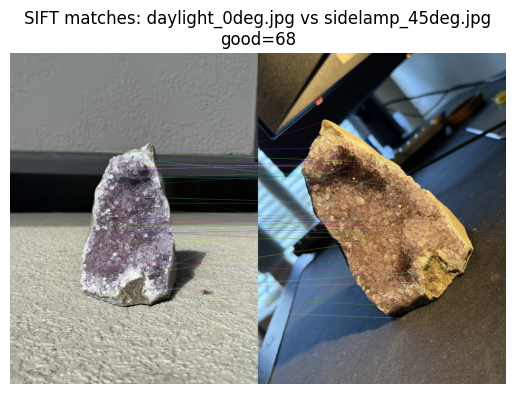

[ORB] base_kps=1000, tgt_kps=1000, good_matches=5


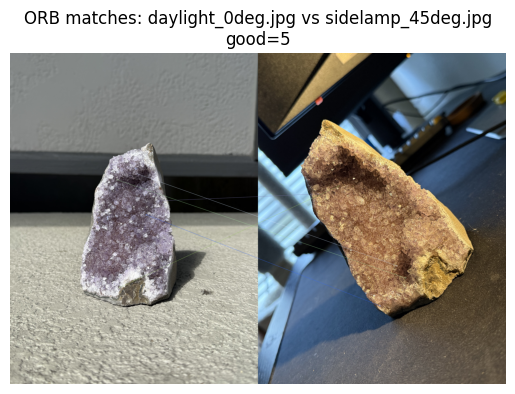

Comparing BASE daylight_0deg.jpg  -->  sidelamp_90rot.jpg
[SIFT] base_kps=23273, tgt_kps=18978, good_matches=68


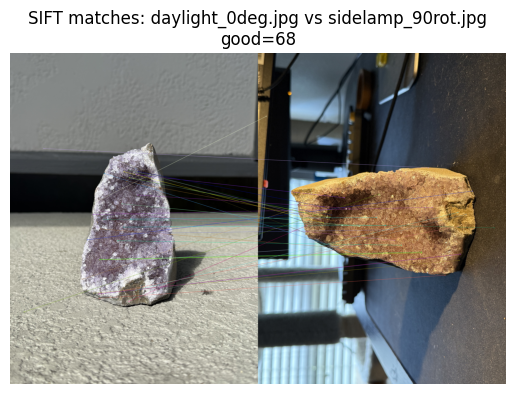

[ORB] base_kps=1000, tgt_kps=1000, good_matches=6


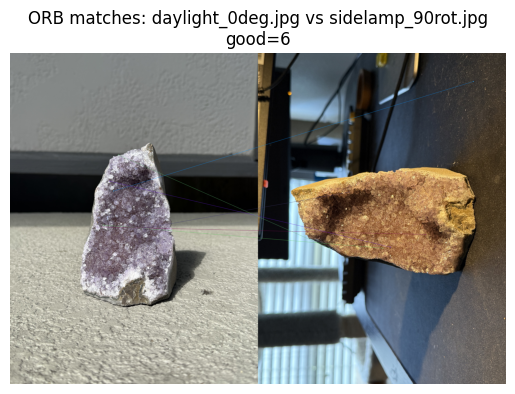

,compare_to,sift_base_kps,sift_tgt_kps,sift_good_matches,orb_base_kps,orb_tgt_kps,orb_good_matches
0,daylight_15deg.jpg,23273,12426,4988,1000,1000,267
1,daylight_45deg.jpg,23273,21473,5472,1000,1000,260
2,daylight_90rot.jpg,23273,21721,3848,1000,1000,270
3,daylight_top.jpg,23273,21986,23,1000,1000,5
4,dimlight_0deg.jpg,23273,23184,221,1000,1000,21
5,dimlight_45deg.jpg,23273,17567,165,1000,1000,12
6,dimlight_90rot.jpg,23273,20790,164,1000,1000,23
7,flash_0deg.jpg,23273,11743,174,1000,1000,29
8,flash_45deg.jpg,23273,943,66,1000,990,2
9,sidelamp_0deg.jpg,23273,22789,56,1000,1000,8


In [24]:
all_results = []

for target_name, target_gray in imgs_gray.items():
    if target_name == base_name:
        continue  # don't match the image to itself

    print("=======================================")
    print(f"Comparing BASE {base_name}  -->  {target_name}")

    row_record = {"compare_to": target_name}

    for detector_name in ['sift', 'orb']:  # add 'surf' if available
        # detect+describe baseline
        base_kps, base_desc = detect_and_describe(detector_name, base_img_gray)
        # detect+describe target
        tgt_kps, tgt_desc   = detect_and_describe(detector_name, target_gray)

        if base_desc is None or tgt_desc is None:
            print(f"[{detector_name}] No descriptors found in {target_name}")
            row_record[f"{detector_name}_base_kps"] = len(base_kps)
            row_record[f"{detector_name}_tgt_kps"]  = len(tgt_kps)
            row_record[f"{detector_name}_good_matches"] = 0
            continue

        # match
        good_matches = match_features(detector_name, base_desc, tgt_desc)

        # store metrics
        row_record[f"{detector_name}_base_kps"] = len(base_kps)
        row_record[f"{detector_name}_tgt_kps"]  = len(tgt_kps)
        row_record[f"{detector_name}_good_matches"] = len(good_matches)

        print(f"[{detector_name.upper()}] base_kps={len(base_kps)}, "
              f"tgt_kps={len(tgt_kps)}, good_matches={len(good_matches)}")

        # visualize matches
        vis_img = draw_matches(
            base_img_rgb, base_kps,
            imgs_rgb[target_name], tgt_kps,
            good_matches,
            max_draw=40
        )

        plt.imshow(vis_img)
        plt.title(f"{detector_name.upper()} matches: {base_name} vs {target_name}\n"
                  f"good={len(good_matches)}")
        plt.axis("off")
        plt.show()

    all_results.append(row_record)

# After loop, show summary in a DataFrame
df_matches = pd.DataFrame(all_results)
df_matches

In [25]:
# quality tagging
def quality_from_matches(n):
    if n >= 40:
        return "Good"
    elif n >= 15:
        return "Fair"
    else:
        return "Poor"

df_matches_eval = df_matches.copy()
for det in ['sift', 'orb']:
    col = f"{det}_good_matches"
    if col in df_matches_eval.columns:
        df_matches_eval[f"{det}_quality"] = df_matches_eval[col].apply(
            lambda x: quality_from_matches(x)
        )

df_matches_eval

,compare_to,sift_base_kps,sift_tgt_kps,sift_good_matches,orb_base_kps,orb_tgt_kps,orb_good_matches,sift_quality,orb_quality
0,daylight_15deg.jpg,23273,12426,4988,1000,1000,267,Good,Good
1,daylight_45deg.jpg,23273,21473,5472,1000,1000,260,Good,Good
2,daylight_90rot.jpg,23273,21721,3848,1000,1000,270,Good,Good
3,daylight_top.jpg,23273,21986,23,1000,1000,5,Fair,Poor
4,dimlight_0deg.jpg,23273,23184,221,1000,1000,21,Good,Fair
5,dimlight_45deg.jpg,23273,17567,165,1000,1000,12,Good,Poor
6,dimlight_90rot.jpg,23273,20790,164,1000,1000,23,Good,Fair
7,flash_0deg.jpg,23273,11743,174,1000,1000,29,Good,Fair
8,flash_45deg.jpg,23273,943,66,1000,990,2,Good,Poor
9,sidelamp_0deg.jpg,23273,22789,56,1000,1000,8,Good,Poor


# Discussion and Conlusion

**Theoretical Background**

According to Gonzales and Woods (2018), feature detection and descriotion are fundamental processes in computer vision that allows image to be represented not by raw intensity values, but by distinct, repeatable patterns that remain invariant under transformations such as translation, rotation and changes to illumination.

The cornerstone of most featyre detectors is the image gradient, defined as:

$$\nabla f(x, y) =
\begin{bmatrix}
\frac{\partial f}{\partial x} \\
\frac{\partial f}{\partial y}
\end{bmatrix} $$

where f(x,y) is the image intensity function.
The gradient magnitude and direction are computed as:

$$M(x, y) = \sqrt{f_x^2 + f_y^2}, \quad
\theta(x, y) = \tan^{-1}\left(\frac{f_y}{f_x}\right) $$

where λ1,λ2 are the eigenvalues of 𝑀, and 𝑘 is typically between 0.04 and 0.06. A high 𝑅 value indicates a strong corner. For SIFT (Scale-Invariant Feature Transform), Gonzalez and Woods describe the process as locating extrema in the Difference of Gaussian (DoG) scale space:

$$D(x,y,σ)=(G(x,y,kσ)−G(x,y,σ))∗I(x,y) $$

where *G* is a Gaussian Kernel and σ controls the scale.
By detecting keypoints at multiple scales and assigning an orientation based on local gradient histograms, SIFT achieves scale and rotation invariance.

On the other hand, ORB (Oriented Fast and Rotated BRIEF) combines a binary corner detector (FAST) and a descriptor (BRIEF), relying on binary intensity test rather than continuous derivatives, making it efficient but more sensitive to lighting and geometric distortions.

**Discussion**

The objective of this notebook is to evaluate the performance of different feature detectors and descriptors (SIFT, SURF, ORB) under varying lighting conditions and viewing angles using an amethyst crystal as the object of study. The crystal’s irregular surface, reflective facets, and detailed texture, makes it a great object to observe how corner and keypoint detection behave with changes in illumination and perspective.

1. Effect of Lighting

Under daylight, both SIFT and ORB produced a relatively high number of keypoints and good matches (e.g., SIFT: 5148–4348 keypoints, 285–615 good matches). Natural diffuse lighting ensured clear texture definition and stable gradient information.
In contrast, dim light significantly reduced the number of effective matches (SIFT: ~50 good matches or less; ORB: under 15), indicating that both algorithms rely heavily on contrast for descriptor reliability.
Under side lamp illumination, specular reflections introduced false edges and brightness gradients, which caused more keypoints to appear but with lower-quality matches—particularly visible in the ORB results. Flash lighting amplified this effect even more, generating saturated regions and misleading correspondences.

2. Effect of Rotation and Angle

As the orientation shifted from 0° to 15° and 45°, SIFT maintained a consistent number of valid correspondences, demonstrating its rotation invariance. The number of good matches gradually decreased (285 → 615 → 31 for extreme angles), which is expected as viewpoint distortion increases.
ORB, on the other hand, showed greater sensitivity to rotation and scale changes—dropping from 25 good matches at small tilts to fewer than 10 at 45° and 90° rotations. This confirms that ORB is computationally efficient, but sacrifices robustness under geometric transformations.

3. Algorithmic Comparison

SIFT showed the highest robustness to both lighting and rotation changes, producing stable matches across multiple conditions and outperforming other detectors in accuracy and reliability.

SURF is a patented algorithm and is not included in the default OpenCV build. To use SURF, one would typically need to rebuild OpenCV with OPENCV_ENABLE_NONFREE CMake option. One can't do that in this envieronment, so for that reason, we didn't include SURF.

ORB delivered faster computation and smaller descriptor sets (fixed to 1000 features), but its match quality was noticeably poorer under lighting and rotation variations.

It is important to note that the visualization of SIFT/ORB matches occasionally shows line misalignment on the right image. This effect is due to geometric distortion from viewpoint changes (tilt ot ratation) and slight differences in framing between images, not due to incorrect feature correspondence. Descriptors remain consistent in feature space, even when visually displaced in the concatenated output.

**Conclusion**

- Lighting has a major impact on feature detection: diffuse daylight yielded the most reliable and consistent results, while dim and flash lighting degraded ORB's performance.

- SIFT proved to be the most robust descriptor, maintaining hundreds of valid correspondences even under moderate viewpoint changes, validating its rotation and scale invariance properties.

- ORB offered efficiency and speed but at the cost of robustness and descriptor distinctiveness, making it less suitable for detailed or reflective objects like the amethyst crystal.

Overall, SIFT provided the best balance between keypoint density, matching accuracy, and invariance to geometric and illumination variations. The observed decline in matches with increasing angle reflects the natural geometric distortion of the object rather than algorithmic failure.

# References

- Gonzalez, R. C., & Woods, R. E. (2018). Digital Image Processing (4ª ed., Global Edition). Pearson
- OpenCV: Introduction to SIFT (Scale-Invariant Feature Transform). (n.d.). Docs.opencv.org. https://docs.opencv.org/3.4/da/df5/tutorial_py_sift_intro.html

- Feature extraction and image classification using OpenCV. (n.d.). Domino.ai. https://domino.ai/blog/feature-extraction-and-image-classification-using-deep-neural-networks
